NOTES:

- Default input size is 224x224. Are there other models which do bigger?

In [19]:
import torch
import clip
from PIL import Image
import mediapy as media
import matplotlib.pyplot as plt

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [3]:
def load_image(name):
    image = preprocess(Image.open(name)).unsqueeze(0).to(device)
    return image

def encode_image(img):
    if type(img) is str:  # load from filename
        img = load_image(img)
    img_features = model.encode_image(img)
    return img_features

def load_text(text):
    return clip.tokenize(text).to(device)

def encode_text(text):
    text = load_text(text)
    text_features = model.encode_text(text)
    return text_features

def clip_scores(img, text):
    with torch.no_grad():
        img = load_image(img)
        text = load_text(text)
        return model(img, text)

def clip_probs(logits_per_image):
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()
    return probs

## Question 0: Does CLIP work at all?

Goal: get an intuition for how well CLIP works on easy examples and how the specific text decription affects things. Also, for how much image size matters

Results: CLIP seems pretty good at these simple cases! Its score is somewhat sensitive to the prompt (puppy vs dog, whether or not you say 'a photo of', but even without that, the correct class(es) are always above the incorrect ones. THe one surprising thing is the living room with books photo, where it put scored *higher* than house. Not sure if this is good or bad, just unexpected.

""

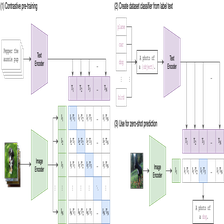

a diagram: 0.9865700006484985
a puppy: 0.0002099999983329326
a photo of a puppy: 0.0016499999910593033
a dog: 0.00418000016361475
a dog sitting: 0.0027099999133497477
a photo of books: 0.003120000008493662
a photo of a house: 0.0007300000288523734
a photo of a happy person: 0.00023999999393709004
a photo of a sad person: 0.0002300000051036477
scissors: 0.00022000000171829015
black scissors: 0.00013000000035390258


""

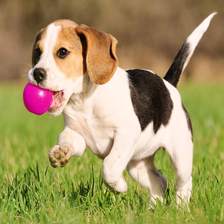

a diagram: 0.0012199999764561653
a puppy: 0.09324999898672104
a photo of a puppy: 0.6789199709892273
a dog: 0.17324000597000122
a dog sitting: 0.041519999504089355
a photo of books: 2.9999999242136255e-05
a photo of a house: 9.999999747378752e-05
a photo of a happy person: 0.01116000022739172
a photo of a sad person: 0.00039999998989515007
scissors: 0.00013000000035390258
black scissors: 1.9999999494757503e-05


""

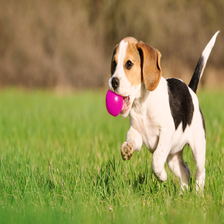

a diagram: 0.0007099999929778278
a puppy: 0.10067000240087509
a photo of a puppy: 0.7429500222206116
a dog: 0.10102999955415726
a dog sitting: 0.04109000042080879
a photo of books: 3.9999998989515007e-05
a photo of a house: 0.00019999999494757503
a photo of a happy person: 0.01271000038832426
a photo of a sad person: 0.0004299999854993075
scissors: 0.00014000000373926014
black scissors: 1.9999999494757503e-05


""

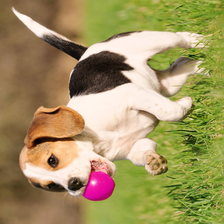

a diagram: 0.004540000110864639
a puppy: 0.17634999752044678
a photo of a puppy: 0.4711399972438812
a dog: 0.2687000036239624
a dog sitting: 0.06372000277042389
a photo of books: 5.999999848427251e-05
a photo of a house: 0.00015999999595806003
a photo of a happy person: 0.014349999837577343
a photo of a sad person: 0.0005799999926239252
scissors: 0.00033999999868683517
black scissors: 5.999999848427251e-05


""

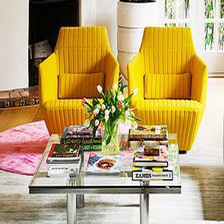

a diagram: 0.0021299999207258224
a puppy: 0.00023999999393709004
a photo of a puppy: 0.0026499999221414328
a dog: 0.0018100000452250242
a dog sitting: 0.007470000069588423
a photo of books: 0.726360023021698
a photo of a house: 0.2431900054216385
a photo of a happy person: 0.006130000110715628
a photo of a sad person: 0.001019999966956675
scissors: 0.005859999917447567
black scissors: 0.0031399999279528856


""

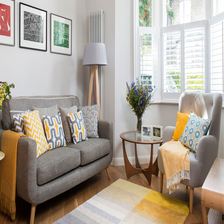

a diagram: 0.010970000177621841
a puppy: 0.0008299999753944576
a photo of a puppy: 0.006010000128298998
a dog: 0.0063599999994039536
a dog sitting: 0.03620000183582306
a photo of books: 0.10100000351667404
a photo of a house: 0.8187699913978577
a photo of a happy person: 0.007519999984651804
a photo of a sad person: 0.0014199999859556556
scissors: 0.007060000207275152
black scissors: 0.003860000055283308


""

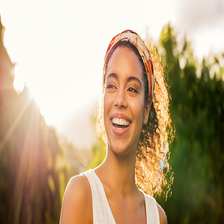

a diagram: 9.999999747378752e-05
a puppy: 0.00039000000106170774
a photo of a puppy: 0.0013200000394135714
a dog: 0.00018000000272877514
a dog sitting: 0.00011999999696854502
a photo of books: 0.00019999999494757503
a photo of a house: 0.0005099999834783375
a photo of a happy person: 0.9938499927520752
a photo of a sad person: 0.002589999930933118
scissors: 0.0002300000051036477
black scissors: 0.0005200000014156103


""

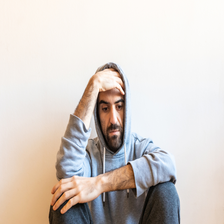

a diagram: 0.0015999999595806003
a puppy: 0.004579999949783087
a photo of a puppy: 0.009800000116229057
a dog: 0.0019399999873712659
a dog sitting: 0.0027799999807029963
a photo of books: 0.0021699999924749136
a photo of a house: 0.0035800000187009573
a photo of a happy person: 0.051920000463724136
a photo of a sad person: 0.9128699898719788
scissors: 0.0044200001284480095
black scissors: 0.004350000061094761


""

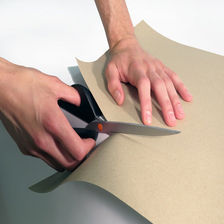

a diagram: 0.11894000321626663
a puppy: 0.0002300000051036477
a photo of a puppy: 0.0006200000061653554
a dog: 0.002309999894350767
a dog sitting: 0.0003100000030826777
a photo of books: 0.037459999322891235
a photo of a house: 0.002409999957308173
a photo of a happy person: 0.004290000069886446
a photo of a sad person: 0.010289999656379223
scissors: 0.6222500205039978
black scissors: 0.20089000463485718


In [4]:
labels = ['a diagram', 
          'a puppy', 
          'a photo of a puppy', 
          'a dog', 
          'a dog sitting', 
          'a photo of books', 
          'a photo of a house', 
          'a photo of a happy person',
          'a photo of a sad person',
          'scissors',
          'black scissors'
         ]
images = ['clip_diagram.png', 'centered_puppy.jpeg', 
          'off_center_puppy.jpeg', 'rotated_puppy.jpeg', 
          'living_room_books.jpeg', 'living_room_no_books.jpeg',
          'happy_person.jpeg', 
          'sad_person.jpeg',  'scissors.jpeg', ]
#           'button', 'keyboard', 'seated_person',
#           'wrench', 'screwdriver',
#           'open_cabinet', 'closed_cabinet']

for img in images:
    filename = f'imgs/{img}'
    # Show image
    image = media.read_image(filename)
    media.show_image(image, height=224, width=224)
    
    # Compute CLIP scores
    probs = clip_probs(clip_scores(filename, labels)[0])[0]
    for label, prob in zip(labels, probs):
        print(f'{label}: {np.round(prob, 5)}')

# Question 1: Can CLIP recognize the relevant objects in the scene?

(1A) Can it recognize the right objects (full scene)?


## 1A: Can CLIP recognize relevant objects in a full scene?

### 1AI: Can you easily get an existance classifier?
    Conclusion: while I think CLIP does better than random guessing, it's really bad at recognizing the right objects in large scenes.

==================== laptop ====================


""

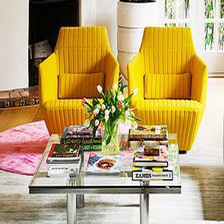

laptop: 0.09822999686002731
object: 0.9017699956893921


""

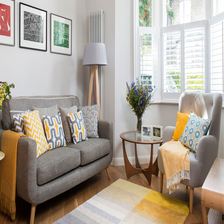

laptop: 0.019449999555945396
object: 0.9805499911308289


""

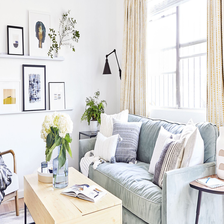

laptop: 0.11034999787807465
object: 0.8896499872207642


""

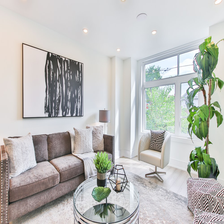

laptop: 0.045079998672008514
object: 0.9549199938774109


""

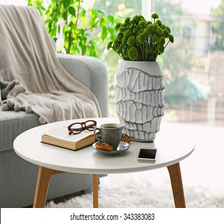

laptop: 0.39649999141693115
object: 0.6035000085830688


""

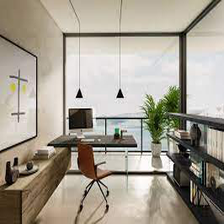

laptop: 0.21660999953746796
object: 0.7833899855613708


""

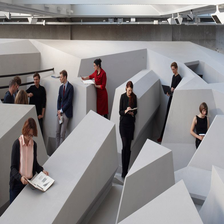

laptop: 0.16572000086307526
object: 0.8342800140380859


""

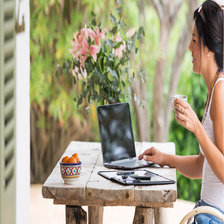

laptop: 0.9915300011634827
object: 0.008469999767839909


""

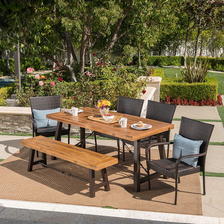

laptop: 0.031780000776052475
object: 0.9682199954986572
==================== computer ====================


""

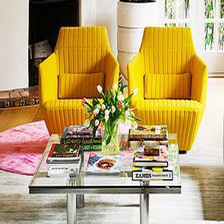

computer: 0.050119999796152115
object: 0.9498800039291382


""

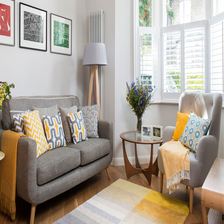

computer: 0.011429999954998493
object: 0.988569974899292


""

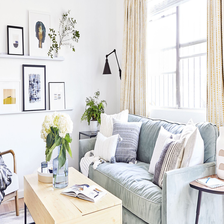

computer: 0.03685000166296959
object: 0.9631500244140625


""

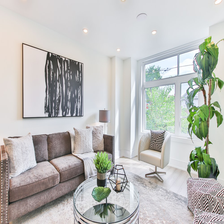

computer: 0.03415999934077263
object: 0.9658399820327759


""

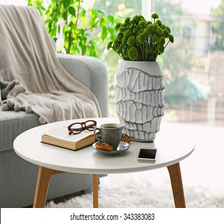

computer: 0.19992999732494354
object: 0.8000699877738953


""

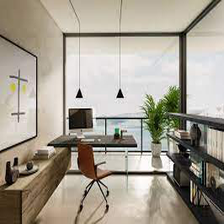

computer: 0.21025000512599945
object: 0.7897499799728394


""

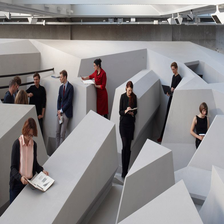

computer: 0.6300299763679504
object: 0.3699699938297272


""

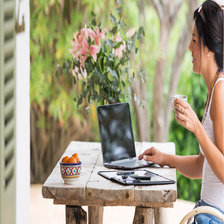

computer: 0.9300699830055237
object: 0.06993000209331512


""

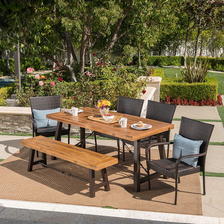

computer: 0.011610000394284725
object: 0.9883900284767151
==================== chair ====================


""

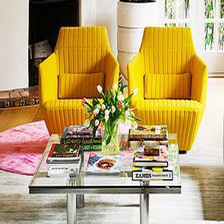

chair: 0.9275400042533875
object: 0.07246000319719315


""

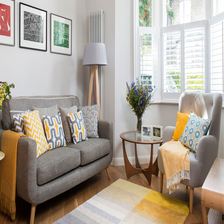

chair: 0.6994199752807617
object: 0.3005799949169159


""

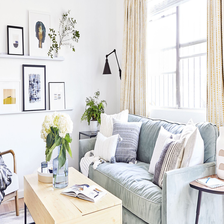

chair: 0.459089994430542
object: 0.540910005569458


""

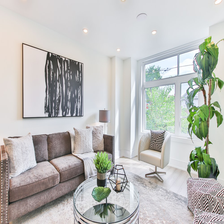

chair: 0.7097100019454956
object: 0.2902899980545044


""

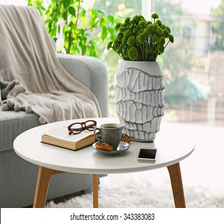

chair: 0.7739999890327454
object: 0.22599999606609344


""

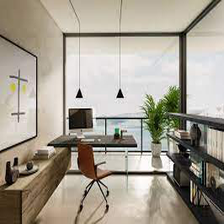

chair: 0.8414199948310852
object: 0.1585800051689148


""

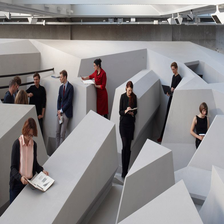

chair: 0.152879998087883
object: 0.8471199870109558


""

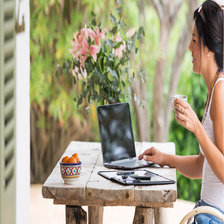

chair: 0.29482999444007874
object: 0.7051699757575989


""

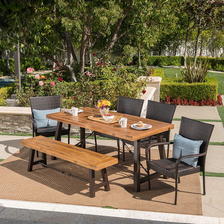

chair: 0.8901000022888184
object: 0.10989999771118164
==================== book ====================


""

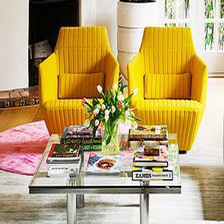

book: 0.4638400077819824
object: 0.5361599922180176


""

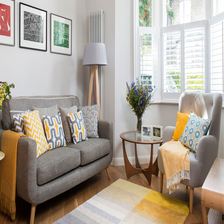

book: 0.1244100034236908
object: 0.8755900263786316


""

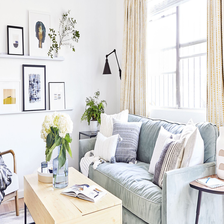

book: 0.280129998922348
object: 0.7198699712753296


""

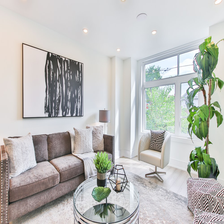

book: 0.3215399980545044
object: 0.6784600019454956


""

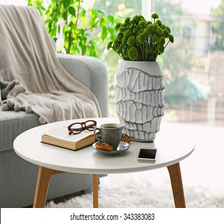

book: 0.27081000804901123
object: 0.7291899919509888


""

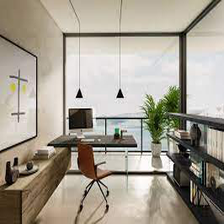

book: 0.24876999855041504
object: 0.751230001449585


""

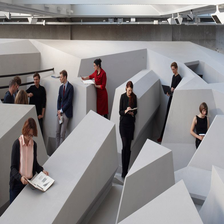

book: 0.12488999962806702
object: 0.8751099705696106


""

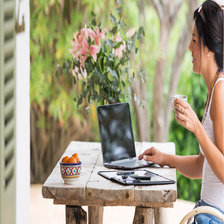

book: 0.6994100213050842
object: 0.30059000849723816


""

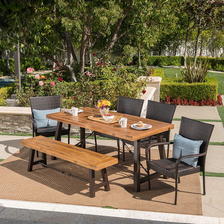

book: 0.24716000258922577
object: 0.752839982509613
==================== cup ====================


""

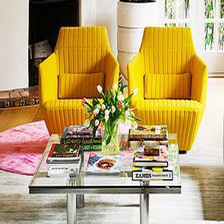

cup: 0.05076000094413757
object: 0.9492400288581848


""

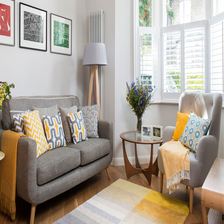

cup: 0.04180999845266342
object: 0.9581900238990784


""

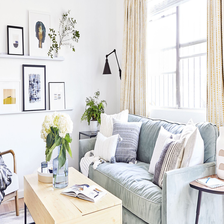

cup: 0.07009000331163406
object: 0.9299100041389465


""

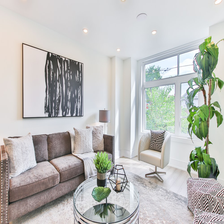

cup: 0.06716000288724899
object: 0.9328399896621704


""

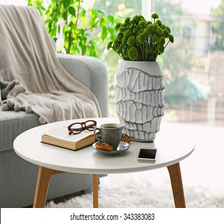

cup: 0.33765000104904175
object: 0.6623499989509583


""

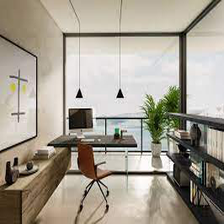

cup: 0.06720999628305435
object: 0.9327899813652039


""

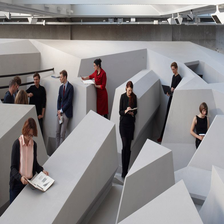

cup: 0.13871000707149506
object: 0.8612899780273438


""

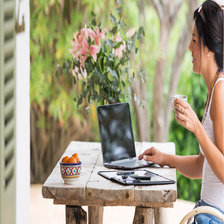

cup: 0.4207499921321869
object: 0.5792499780654907


""

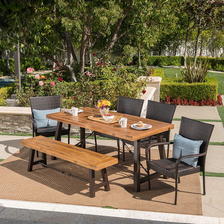

cup: 0.10346999764442444
object: 0.8965299725532532


In [46]:
labels = ['laptop', 
          'computer',
          'chair', 
          'book', 
          'cup' ]
images = ['living_room_books.jpeg', 'living_room_no_books.jpeg',
          'living_room_3', 'living_room_4.jpeg', 'living_room_5.jpg',
         'office1.jpeg', 'office_2.jpg', 'outdoor_garden.jpg', 'patio.jpg']

for label in labels:
    # I tried two ways of computing the 'default' option.
    # First, I tried appending 'no' (e.g. labels  are 'laptop' and 'no laptop')
    # Since this didn't work well, I treid comparing 'laptop' with 'object'
    label_set = [label, 'no ' + label]
    label_set = [label, 'object']
    print("=" * 20, label, "=" * 20)
    for img in images:
        filename = f'imgs/{img}'
        # Show image
        image = media.read_image(filename)
        media.show_image(image, height=224, width=224)

        # Compute CLIP scores
        probs = clip_probs(clip_scores(filename, label_set)[0])[0]
        for label, prob in zip(label_set, probs):
            print(f'{label}: {np.round(prob, 5)}')

### 1Aii: If you crop out the relevant objects, can it find them? 

    Not perfectly, but still pretty well!

==================== laptop ====================


""

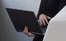

laptop: 0.9548400044441223
object: 0.045159999281167984


""


laptop: 0.1052900031208992
object: 0.8947100043296814


""

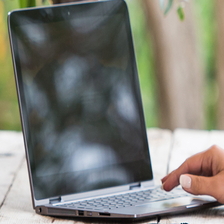

laptop: 0.9947400093078613
object: 0.005260000005364418


""

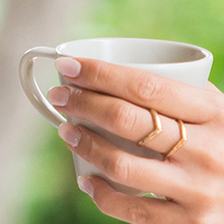

laptop: 0.00953999999910593
object: 0.9904599785804749


""

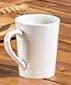

laptop: 0.0058200000785291195
object: 0.9941800236701965


""

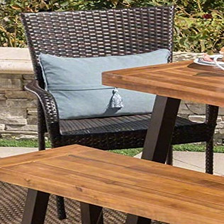

laptop: 0.16290999948978424
object: 0.837090015411377
==================== computer ====================


""

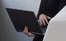

computer: 0.7040899991989136
object: 0.2959100008010864


""


computer: 0.028049999848008156
object: 0.9719499945640564


""

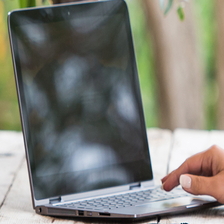

computer: 0.9561100006103516
object: 0.04388999938964844


""

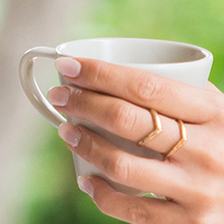

computer: 0.014189999550580978
object: 0.9858099818229675


""

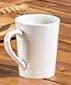

computer: 0.016289999708533287
object: 0.983709990978241


""

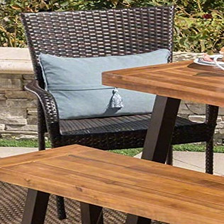

computer: 0.028359999880194664
object: 0.9716399908065796
==================== chair ====================


""

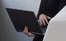

chair: 0.25494998693466187
object: 0.7450500130653381


""


chair: 0.16208000481128693
object: 0.8379200100898743


""

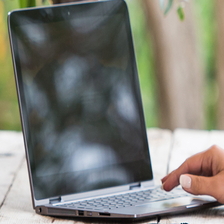

chair: 0.18896999955177307
object: 0.8110299706459045


""

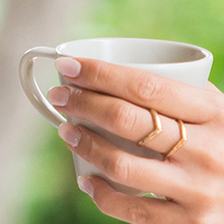

chair: 0.07773000001907349
object: 0.9222699999809265


""

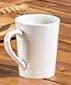

chair: 0.10903000086545944
object: 0.89096999168396


""

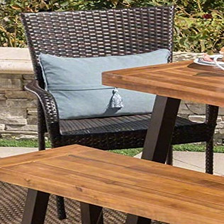

chair: 0.8748999834060669
object: 0.1251000016927719
==================== book ====================


""

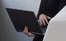

book: 0.08365000039339066
object: 0.9163500070571899


""


book: 0.07062000036239624
object: 0.9293799996376038


""

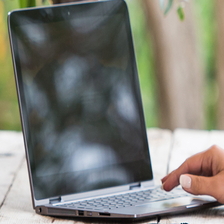

book: 0.47731998562812805
object: 0.5226799845695496


""

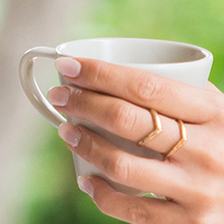

book: 0.1354299932718277
object: 0.8645700216293335


""

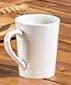

book: 0.00773000018671155
object: 0.9922699928283691


""

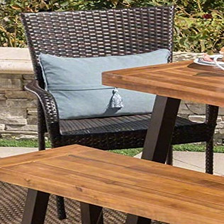

book: 0.0486299991607666
object: 0.9513700008392334
==================== cup ====================


""

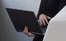

cup: 0.08489999920129776
object: 0.9150999784469604


""


cup: 0.18717999756336212
object: 0.8128200173377991


""

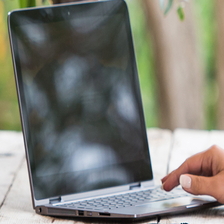

cup: 0.2218800038099289
object: 0.7781199812889099


""

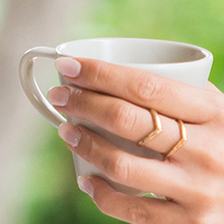

cup: 0.9897500276565552
object: 0.010250000283122063


""

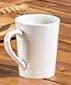

cup: 0.9960200190544128
object: 0.003980000037699938


""

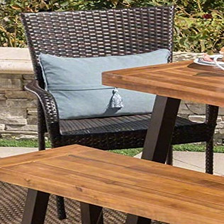

cup: 0.2757900059223175
object: 0.7242100238800049


In [12]:
labels = ['laptop', 
          'computer',
          'chair', 
          'book', 
          'cup' ]
images = ['office_2_laptop.jpg', 'office_2_book.jpg', 
          'outdoor_garden_laptop.jpg', 'outdoor_garden_cup.jpg', 
          'patio_cup.jpg', 'patio_chair.jpg']

for label in labels:
    label_set = [label, 'no ' + label]
    label_set = [label, 'object']
    print("=" * 20, label, "=" * 20)
    for img in images:
        filename = f'imgs/{img}'
        # Show image
        image = media.read_image(filename)
        media.show_image(image, height=224, width=224)

        # Compute CLIP scores
        probs = clip_probs(clip_scores(filename, label_set)[0])[0]
        for label, prob in zip(label_set, probs):
            print(f'{label}: {np.round(prob, 5)}')

# Question 2: Can CLIP recognize relevant attributes of objects in the scene?

(2A) Does it know spatial attributes (above, below, next to, close to, upside down, spilled, tilted)? Does it know other object attributes (open, closed, various colors)

(2B) Do its scores vary in a reasonable way as you adjust the value of that attribute?

=====


""

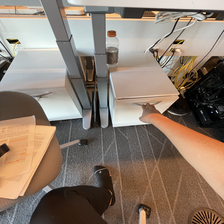

open drawer: prob 0.7477399706840515, logit 23.520620346069336
closed drawer: prob 0.2522599995136261, logit 22.434019088745117
=====


""

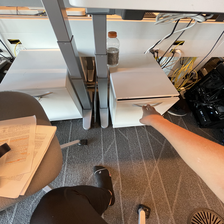

open drawer: prob 0.742929995059967, logit 24.060590744018555
closed drawer: prob 0.25707000494003296, logit 22.999340057373047
=====


""

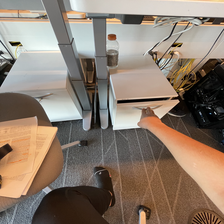

open drawer: prob 0.7097700238227844, logit 25.05997085571289
closed drawer: prob 0.29023000597953796, logit 24.16568946838379
=====


""

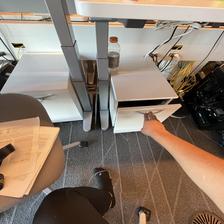

open drawer: prob 0.676829993724823, logit 24.19870948791504
closed drawer: prob 0.323170006275177, logit 23.459449768066406
=====


""

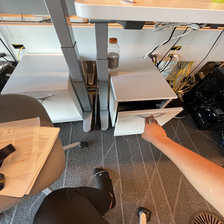

open drawer: prob 0.665690004825592, logit 26.10502052307129
closed drawer: prob 0.33430999517440796, logit 25.41628074645996
=====


""

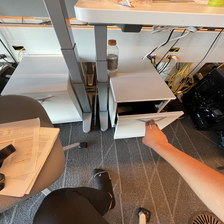

open drawer: prob 0.6932700276374817, logit 22.293270111083984
closed drawer: prob 0.3067300021648407, logit 21.47780990600586
=====


""

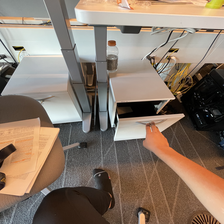

open drawer: prob 0.6836400032043457, logit 21.674089431762695
closed drawer: prob 0.3163599967956543, logit 20.90353012084961
=====


""

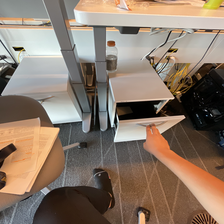

open drawer: prob 0.6997500061988831, logit 22.03969955444336
closed drawer: prob 0.30024999380111694, logit 21.1936092376709
=====


""

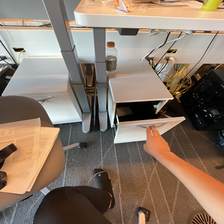

open drawer: prob 0.7022299766540527, logit 22.509830474853516
closed drawer: prob 0.2977699935436249, logit 21.651880264282227
=====


""

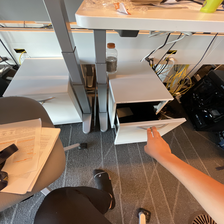

open drawer: prob 0.6689000129699707, logit 22.96051025390625
closed drawer: prob 0.3310999870300293, logit 22.25727081298828
=====


""

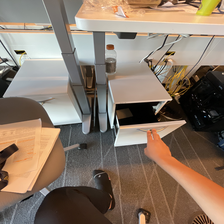

open drawer: prob 0.6972200274467468, logit 23.68893051147461
closed drawer: prob 0.30278000235557556, logit 22.854820251464844
=====


""

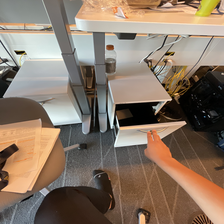

open drawer: prob 0.6726899743080139, logit 24.247419357299805
closed drawer: prob 0.3273099958896637, logit 23.527040481567383
=====


""

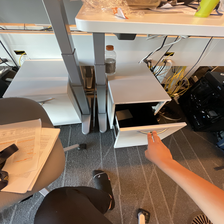

open drawer: prob 0.6488199830055237, logit 23.55817985534668
closed drawer: prob 0.35117998719215393, logit 22.944339752197266
=====


""

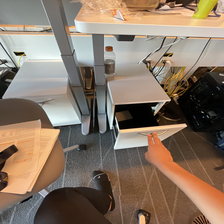

open drawer: prob 0.6605499982833862, logit 23.816879272460938
closed drawer: prob 0.33945000171661377, logit 23.15110969543457
=====


""

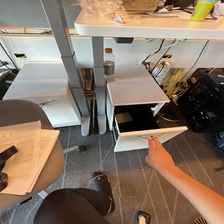

open drawer: prob 0.6863200068473816, logit 23.576770782470703
closed drawer: prob 0.3136799931526184, logit 22.793819427490234
=====


""

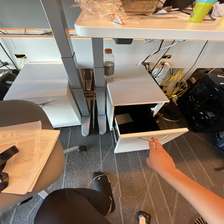

open drawer: prob 0.6443700194358826, logit 23.46198081970215
closed drawer: prob 0.3556300103664398, logit 22.867589950561523
=====


""

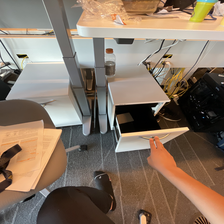

open drawer: prob 0.6653000116348267, logit 23.303089141845703
closed drawer: prob 0.33469998836517334, logit 22.616100311279297


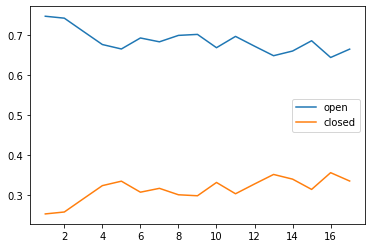

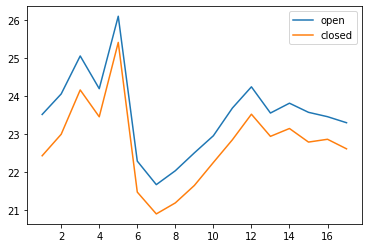

In [21]:
# Open/Closed
open_probs = []
open_logits = []
closed_probs = []
closed_logits = []


for i in range(1, 18):
    print("=====", i)
    label_set = ['open drawer', 'closed drawer']
    filename = f'imgs/hand{i}.png'
    # Show image
    image = media.read_image(filename)
    media.show_image(image, height=224, width=224)

    # Compute CLIP scores
    logits = clip_scores(filename, label_set)[0]
    probs = clip_probs(logits)[0]
    open_probs.append(probs[0])
    closed_probs.append(probs[1])
    open_logits.append(logits[0, 0])
    closed_logits.append(logits[0, 1])
    for label, prob, logit in zip(label_set, probs, logits[0]):
        print(f'{label}: prob {np.round(prob, 5)}, logit {np.round(logit, 5)}')
        
plt.plot(range(1, 18), open_probs)
plt.plot(range(1, 18), closed_probs)
plt.legend(['open', 'closed'])
plt.show()
plt.plot(range(1, 18), open_logits)
plt.plot(range(1, 18), closed_logits)
plt.legend(['open', 'closed'])
plt.show()

===== 1
fully open cabinet: prob 0.8790799975395203, logit 23.33694076538086
fully closed cabinet: prob 0.12092000246047974, logit 21.353160858154297
===== 2
fully open cabinet: prob 0.8797399997711182, logit 23.612239837646484
fully closed cabinet: prob 0.12026000022888184, logit 21.6223201751709
===== 3
fully open cabinet: prob 0.855180025100708, logit 24.15921974182129
fully closed cabinet: prob 0.14482000470161438, logit 22.38343048095703
===== 4
fully open cabinet: prob 0.8354799747467041, logit 23.554210662841797
fully closed cabinet: prob 0.1645199954509735, logit 21.92922019958496
===== 5
fully open cabinet: prob 0.8619300127029419, logit 25.79058074951172
fully closed cabinet: prob 0.1380700021982193, logit 23.95915985107422
===== 6
fully open cabinet: prob 0.7660099864006042, logit 22.530059814453125
fully closed cabinet: prob 0.23398999869823456, logit 21.344139099121094
===== 7
fully open cabinet: prob 0.758430004119873, logit 22.112089157104492
fully closed cabinet: prob 0

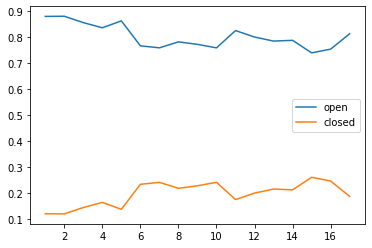

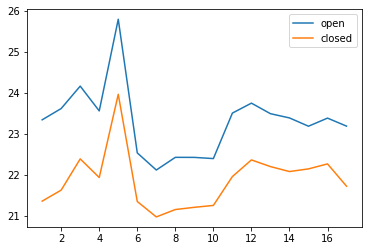

In [25]:
# Open/Closed (DIFFERNT PROMPT LABELS)
open_probs = []
open_logits = []
closed_probs = []
closed_logits = []


for i in range(1, 18):
    print("=====", i)
    label_set = ['fully open cabinet', 'fully closed cabinet']
    filename = f'imgs/hand{i}.png'
    # Show image
#     image = media.read_image(filename)
#     media.show_image(image, height=224, width=224)

    # Compute CLIP scores
    logits = clip_scores(filename, label_set)[0]
    probs = clip_probs(logits)[0]
    open_probs.append(probs[0])
    closed_probs.append(probs[1])
    open_logits.append(logits[0, 0])
    closed_logits.append(logits[0, 1])
    for label, prob, logit in zip(label_set, probs, logits[0]):
        print(f'{label}: prob {np.round(prob, 5)}, logit {np.round(logit, 5)}')
        
plt.plot(range(1, 18), open_probs)
plt.plot(range(1, 18), closed_probs)
plt.legend(['open', 'closed'])
plt.show()
plt.plot(range(1, 18), open_logits)
plt.plot(range(1, 18), closed_logits)
plt.legend(['open', 'closed'])
plt.show()

===== 1


""

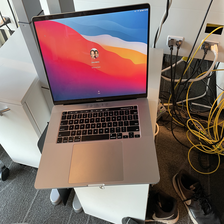

photo of cup touching laptop: logit 26.433359146118164
===== 2


""

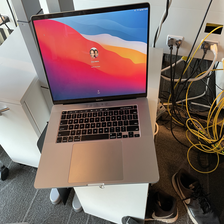

photo of cup touching laptop: logit 26.841270446777344
===== 3


""

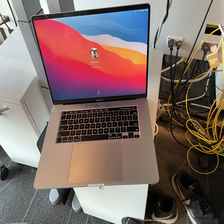

photo of cup touching laptop: logit 27.168899536132812
===== 4


""

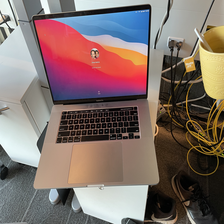

photo of cup touching laptop: logit 26.088069915771484
===== 5


""

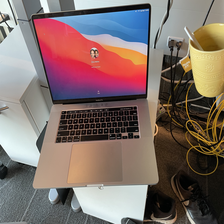

photo of cup touching laptop: logit 27.59819984436035
===== 6


""

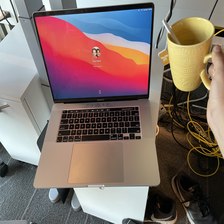

photo of cup touching laptop: logit 30.679079055786133
===== 7


""

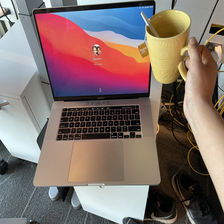

photo of cup touching laptop: logit 32.46799850463867
===== 8


""

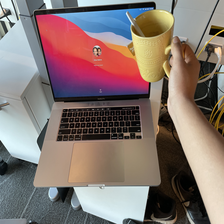

photo of cup touching laptop: logit 32.23064041137695
===== 9


""

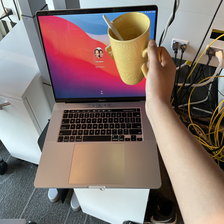

photo of cup touching laptop: logit 33.18408966064453
===== 10


""

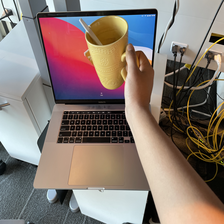

photo of cup touching laptop: logit 31.99148941040039
===== 11


""

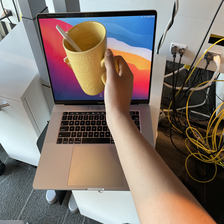

photo of cup touching laptop: logit 31.935070037841797
===== 12


""

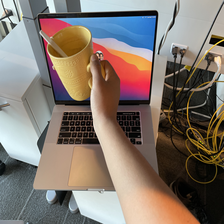

photo of cup touching laptop: logit 33.905479431152344
===== 13


""

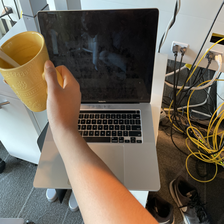

photo of cup touching laptop: logit 31.501300811767578
===== 14


""

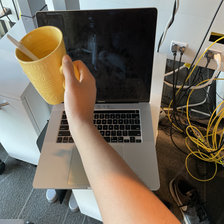

photo of cup touching laptop: logit 33.45391845703125
===== 15


""

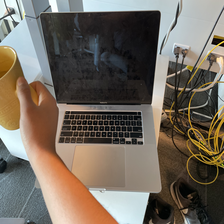

photo of cup touching laptop: logit 29.850759506225586
===== 16


""

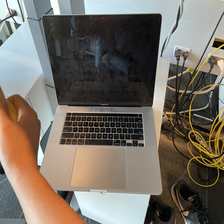

photo of cup touching laptop: logit 29.620960235595703
===== 17


""

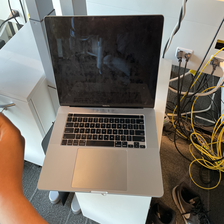

photo of cup touching laptop: logit 29.195720672607422
===== 18


""

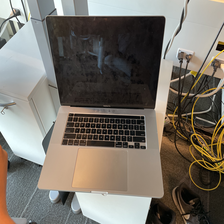

photo of cup touching laptop: logit 28.379610061645508
===== 19


""

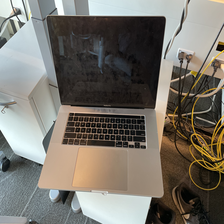

photo of cup touching laptop: logit 28.12091064453125
===== 20


""

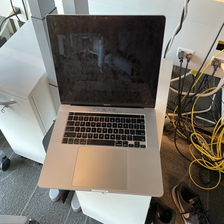

photo of cup touching laptop: logit 28.230859756469727


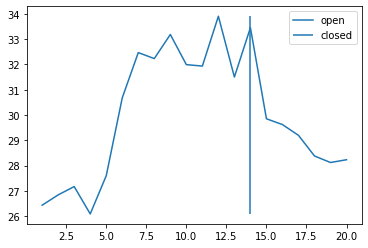

In [38]:
# cup over laptop
# open_probs = []
cup_logits = []
# closed_probs = []
# closed_logits = []


for i in range(1, 21):
    print("=====", i)
    label_set = ['photo of cup touching laptop']
    filename = f'imgs/cup{i}.png'
    # Show image
    image = media.read_image(filename)
    media.show_image(image, height=224, width=224)

    # Compute CLIP scores
    logits = clip_scores(filename, label_set)[0]
    cup_logits.append(logits[0, 0])
    for label, logit in zip(label_set, logits[0]):
        print(f'{label}: logit {np.round(logit, 5)}')
        
plt.plot(range(1, 21), cup_logits)
plt.vlines(14, np.min(cup_logits), np.max(cup_logits))
plt.legend(['logits'])
plt.show()

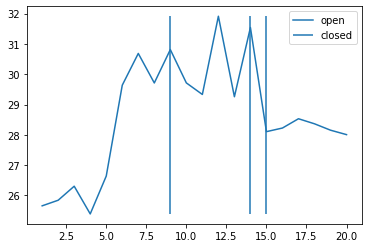

In [35]:
# "cup over laptop"
plt.plot(range(1, 21), cup_logits)
plt.vlines(9, np.min(cup_logits), np.max(cup_logits))
plt.vlines(14, np.min(cup_logits), np.max(cup_logits))
plt.vlines(15, np.min(cup_logits), np.max(cup_logits))
plt.legend(['open', 'closed'])
plt.show()

===== 1


""

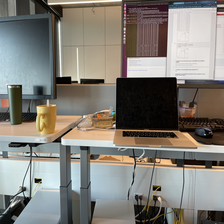

mug resting on laptop: logit 21.25090980529785
photo of mug on laptop: logit 23.925180435180664
mug over laptop: logit 23.399620056152344
cup on top of laptop: logit 23.54231071472168
===== 2


""

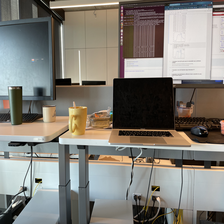

mug resting on laptop: logit 21.716480255126953
photo of mug on laptop: logit 24.57733917236328
mug over laptop: logit 23.81679916381836
cup on top of laptop: logit 23.542470932006836
===== 3


""

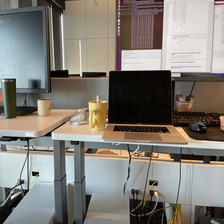

mug resting on laptop: logit 23.69219970703125
photo of mug on laptop: logit 26.223249435424805
mug over laptop: logit 26.16381072998047
cup on top of laptop: logit 26.14550018310547
===== 4


""

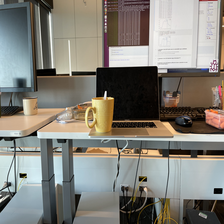

mug resting on laptop: logit 24.159080505371094
photo of mug on laptop: logit 27.039379119873047
mug over laptop: logit 26.356359481811523
cup on top of laptop: logit 25.304019927978516
===== 5


""

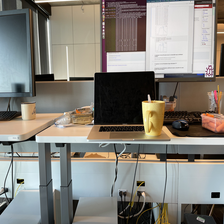

mug resting on laptop: logit 21.86115074157715
photo of mug on laptop: logit 24.371999740600586
mug over laptop: logit 23.975879669189453
cup on top of laptop: logit 23.365039825439453
===== 6


""

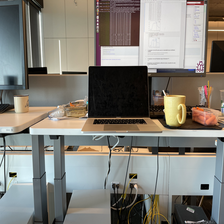

mug resting on laptop: logit 23.724180221557617
photo of mug on laptop: logit 26.38412094116211
mug over laptop: logit 26.105390548706055
cup on top of laptop: logit 25.249300003051758
===== 7


""

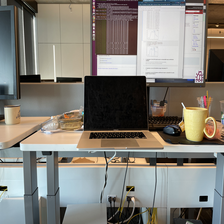

mug resting on laptop: logit 22.654850006103516
photo of mug on laptop: logit 25.381879806518555
mug over laptop: logit 24.526979446411133
cup on top of laptop: logit 24.25851058959961


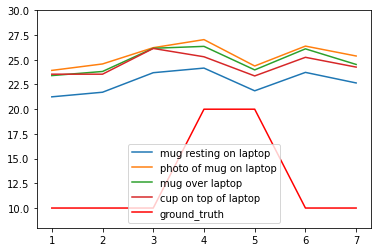

In [41]:
# MUG OVER LAPTOP

label_set = ['mug resting on laptop', 
                 'photo of mug on laptop',
                'mug over laptop',
                'cup on top of laptop']
logits_list = {label: [] for label in label_set}

for i in range(1, 8):
    print("=====", i)
    
    filename = f'imgs/mug{i}.png'
    # Show image
    image = media.read_image(filename)
    media.show_image(image, height=224, width=224)

    # Compute CLIP scores
    logits = clip_scores(filename, label_set)[0][0]
    for label, logit in zip(label_set, logits):
        logits_list[label].append(logit)
        print(f'{label}: logit {np.round(logit, 5)}')
        
for label in label_set:
    plt.plot(range(1, 8), logits_list[label])
ground_truth = np.array([0, 0, 0, 1, 1, 0, 0]) * 10 + 10
plt.ylim(8, 30)
plt.plot(range(1,8), ground_truth, color='red')
plt.legend(label_set + ['ground_truth'])
plt.show()

===== 1


""

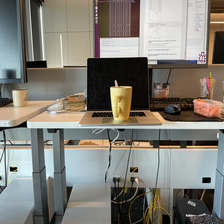

mug resting on laptop: logit 23.51136016845703
photo of mug on laptop: logit 25.85173988342285
mug over laptop: logit 26.447540283203125
cup on top of laptop: logit 27.175670623779297
===== 2


""

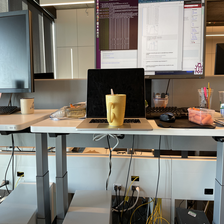

mug resting on laptop: logit 20.52861976623535
photo of mug on laptop: logit 23.41337013244629
mug over laptop: logit 23.352500915527344
cup on top of laptop: logit 23.30950927734375
===== 3


""

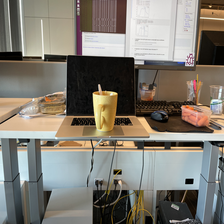

mug resting on laptop: logit 24.959569931030273
photo of mug on laptop: logit 27.7189998626709
mug over laptop: logit 27.985179901123047
cup on top of laptop: logit 29.192720413208008
===== 4


""

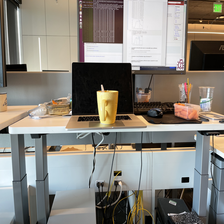

mug resting on laptop: logit 23.53714942932129
photo of mug on laptop: logit 25.793819427490234
mug over laptop: logit 26.4599609375
cup on top of laptop: logit 27.213769912719727
===== 5


""

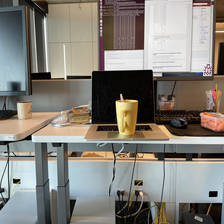

mug resting on laptop: logit 22.78837013244629
photo of mug on laptop: logit 24.820159912109375
mug over laptop: logit 25.012920379638672
cup on top of laptop: logit 25.745189666748047


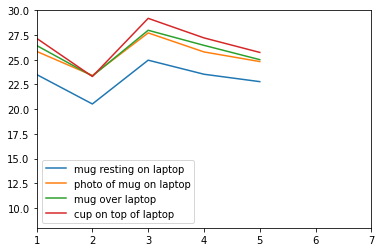

In [45]:
label_set = ['mug resting on laptop', 
                 'photo of mug on laptop',
                'mug over laptop',
                'cup on top of laptop']
logits_list = {label: [] for label in label_set}

for i in range(1, 6):
    print("=====", i)
    
    filename = f'imgs/mug_center_{i}.png'
    # Show image
    image = media.read_image(filename)
    media.show_image(image, height=224, width=224)

    # Compute CLIP scores
    logits = clip_scores(filename, label_set)[0][0]
    for label, logit in zip(label_set, logits):
        logits_list[label].append(logit)
        print(f'{label}: logit {np.round(logit, 5)}')
        
for label in label_set:
    plt.plot(range(1, 6), logits_list[label])
plt.ylim(8, 30)
plt.xlim(1,7)
plt.legend(label_set + ['ground_truth'])
plt.show()

# Question 3: Are CLIP attention maps informative???

TODO!!

# Question 4: Are CLIP features sufficient to learn a classifier for some domain-relevant feature?

TODO!!